In [51]:
import pandas as pd
import numpy as np

In [20]:
""""
Data has been collected from the publically available sources from https://fred.stlouisfed.org/ 

I have considered 
Disposable Income : which sending capacity of the person

Monthly supply: Which is monthly home supply of new homes

Mortgage: Which is also very important factor which affect demand side of housing market

Personal Consumption: Which indicates the spending pattern

Savings: Savings is major deciding factor in a decision for home purchase

Emp. Rate (Employment rate): As more people are employed that gives more income in the hands, hence creates demand in the housing market

Uemp. Rate (Unemployment rate): which creates negative impact on the demand of the Housing Market

GDP: As GDP of the nation increases, it creates positive impact on demand of the housing market

Federal Fund Effective Rate: This is the interest rate at which banks lend other banks excess reserves they have on deposit with their supervising. So this is also not only connected with Mortgage rate but also influence many factors that affect the real estate market

House Permit: This is total New Privately-Owned Housing Units Authorized in Permit-Issuing Places, affects supply side of the housing market

New Unit started : Similar as house permit, affect supply side

Economic policy uncertainty: Economic policy uncertainty is considered a risk in which government policies and regulatory frameworks are undefined for the near future. This phenomenon may lead businesses and individuals to delay spending and investments because of uncertainty in the market.
which directly affect the housing market

Financial Stress Index : this measures the degree of financial stress in an economy, also have indirect impact on housing market

Price Index: this is S&P/Case-Shiller U.S. National Home Price Index which represent whole housing market of USA.
 I have taken this as on output for model

"""

'"\nData has been collected from the publically available sources from https://fred.stlouisfed.org/ \n\nI have considered \nDisposable Income : which sending capacity of the person\nMonthly supply: Which is monthly home supply of new homes\nMortgage: Which is also very important factor which affect demand side of housing market\nPersonal Consumption: Which indicates the spending pattern\nSavings: Savings is major deciding factor in a decision for home purchase\nEmp. Rate (Employment rate): As more people are employed that gives more income in the hands, hence creates demand in the housing market\nUemp. Rate (Unemployment rate): which creates negative impact on the demand of the Housing Market\nGDP: As GDP of the nation increases, it creates positive impact on demand of the housing market\nFederal Fund Effective Rate: This is the interest rate at which banks lend other banks excess reserves they have on deposit with their supervising. So this is also not only connected with Mortgage rat

### Data Preparation

In [21]:
df = pd.read_csv("final data\Dataset.csv")

In [22]:
df.dropna(subset=['Price Index'], inplace= True)
df.reset_index(inplace=True)
df.drop(labels=['index'], axis=1, inplace= True)

In [23]:
df.head()

,Time,Disposable Income,Monthly supply,Mortgage,Personal Consumption,Savings,Emp. Rate,Uemp. Rate,GDP,Federal Fund Effective Rate,House Permit,Economic policy uncertainty,New Unit started,Financial Stress Index,Price Index
0,01-12-1986,6135.8,5.5,9.31,2997.1,235.0,70.10,6.6,99.9,6.91,1903.0,90.30,1833.0,NaN,63.97
1,01-01-1987,6159.5,6.0,9.20,2935.5,326.4,70.16,6.6,99.9,6.43,1690.0,93.66,1774.0,NaN,64.42
2,01-02-1987,6192.1,6.2,9.08,3001.7,290.3,70.29,6.6,99.9,6.10,1689.0,70.56,1784.0,NaN,64.74
3,01-03-1987,6200.0,6.0,9.04,3013.3,292.3,70.32,6.6,99.9,6.13,1704.0,69.18,1726.0,NaN,65.13
4,01-04-1987,5967.2,6.0,9.83,3038.8,149.8,70.50,6.3,99.9,6.37,1601.0,77.08,1614.0,NaN,65.57


In [24]:
mn = df['Financial Stress Index'].mean()
df['Financial Stress Index'].fillna(value=mn,inplace=True)

gd = df['GDP'].mean()
df['GDP'].fillna(value=gd,inplace=True)

In [25]:
df['Time']=pd.to_datetime(df['Time'])

In [27]:
dp = df.copy()

In [28]:
df['Year'] = pd.DatetimeIndex(df['Time']).year
df['Month'] = pd.DatetimeIndex(df['Time']).month

In [29]:
dp.drop(labels=['Time'],axis=1,inplace=True)

In [30]:
dp.head()

,Disposable Income,Monthly supply,Mortgage,Personal Consumption,Savings,Emp. Rate,Uemp. Rate,GDP,Federal Fund Effective Rate,House Permit,Economic policy uncertainty,New Unit started,Financial Stress Index,Price Index
0,6135.8,5.5,9.31,2997.1,235.0,70.10,6.6,99.9,6.91,1903.0,90.30,1833.0,0.001791,63.97
1,6159.5,6.0,9.20,2935.5,326.4,70.16,6.6,99.9,6.43,1690.0,93.66,1774.0,0.001791,64.42
2,6192.1,6.2,9.08,3001.7,290.3,70.29,6.6,99.9,6.10,1689.0,70.56,1784.0,0.001791,64.74
3,6200.0,6.0,9.04,3013.3,292.3,70.32,6.6,99.9,6.13,1704.0,69.18,1726.0,0.001791,65.13
4,5967.2,6.0,9.83,3038.8,149.8,70.50,6.3,99.9,6.37,1601.0,77.08,1614.0,0.001791,65.57


In [31]:
dp.describe()

,Disposable Income,Monthly supply,Mortgage,Personal Consumption,Savings,Emp. Rate,Uemp. Rate,GDP,Federal Fund Effective Rate,House Permit,Economic policy uncertainty,New Unit started,Financial Stress Index,Price Index
count,425.000000,425.000000,425.000000,425.000000,425.000000,425.000000,425.000000,425.000000,425.000000,425.000000,425.000000,425.000000,425.000000,425.000000
mean,10528.437176,5.806588,6.327953,8506.710118,689.380706,70.760400,5.856706,99.954846,3.152918,1350.642353,106.709859,1334.468235,0.001791,135.887788
std,2835.353366,1.686462,2.209829,3730.481833,632.222210,2.239786,1.651360,1.121812,2.715272,395.807735,57.038479,385.145396,0.867423,53.684610
min,5967.200000,3.300000,2.680000,2935.500000,149.800000,60.260000,3.500000,91.500000,0.050000,513.000000,38.210000,478.000000,-1.089100,63.970000
25%,7790.900000,4.400000,4.270000,5020.500000,362.900000,69.390000,4.700000,99.600000,0.210000,1078.000000,70.560000,1092.000000,-0.426500,81.620000
50%,10670.300000,5.500000,6.250000,8271.600000,440.700000,71.220000,5.500000,100.000000,2.790000,1365.000000,90.570000,1370.000000,-0.028300,139.730000
75%,12453.300000,6.700000,7.910000,11318.500000,930.000000,72.280000,6.600000,100.600000,5.390000,1626.000000,125.670000,1592.000000,0.079800,174.800000
max,19119.500000,12.200000,11.260000,16911.200000,6392.500000,74.510000,14.700000,101.800000,9.850000,2263.000000,555.320000,2273.000000,7.908000,304.830000


In [32]:
df.dtypes

Time                           datetime64[ns]
Disposable Income                     float64
Monthly supply                        float64
Mortgage                              float64
Personal Consumption                  float64
Savings                               float64
Emp. Rate                             float64
Uemp. Rate                            float64
GDP                                   float64
Federal Fund Effective Rate           float64
House Permit                          float64
Economic policy uncertainty           float64
New Unit started                      float64
Financial Stress Index                float64
Price Index                           float64
Year                                    int64
Month                                   int64
dtype: object

In [33]:
df.head()

,Time,Disposable Income,Monthly supply,Mortgage,Personal Consumption,Savings,Emp. Rate,Uemp. Rate,GDP,Federal Fund Effective Rate,House Permit,Economic policy uncertainty,New Unit started,Financial Stress Index,Price Index,Year,Month
0,1986-01-12,6135.8,5.5,9.31,2997.1,235.0,70.10,6.6,99.9,6.91,1903.0,90.30,1833.0,0.001791,63.97,1986,1
1,1987-01-01,6159.5,6.0,9.20,2935.5,326.4,70.16,6.6,99.9,6.43,1690.0,93.66,1774.0,0.001791,64.42,1987,1
2,1987-01-02,6192.1,6.2,9.08,3001.7,290.3,70.29,6.6,99.9,6.10,1689.0,70.56,1784.0,0.001791,64.74,1987,1
3,1987-01-03,6200.0,6.0,9.04,3013.3,292.3,70.32,6.6,99.9,6.13,1704.0,69.18,1726.0,0.001791,65.13,1987,1
4,1987-01-04,5967.2,6.0,9.83,3038.8,149.8,70.50,6.3,99.9,6.37,1601.0,77.08,1614.0,0.001791,65.57,1987,1


### Data Analysis

In [34]:
import pandas_profiling as pp
import matplotlib.pyplot as plt
import seaborn as sb

In [35]:
pp.ProfileReport(df)

Render HTML: 100%|██████████| 1/1 [00:05<00:00,  5.89s/it]


### Modelling

In [38]:
from xgboost import XGBRegressor
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import train_test_split as tts
from sklearn import metrics

In [39]:
x = dp.drop(['Price Index'], axis=1)
y = dp['Price Index']

In [40]:
x_train, x_test, y_train, y_test = tts(x, y, test_size=0.3, random_state=45)

In [41]:
reg = LinearRegression()
reg.fit(x_train, y_train)

LinearRegression()

In [42]:
reg.score(x_train, y_train) , reg.score(x_test, y_test)

(0.9840596821650148, 0.9820024382512708)

In [43]:
ela = ElasticNet(max_iter=10000)
ela.fit(x_train, y_train)

ElasticNet(max_iter=10000)

In [44]:
ela.score(x_train,y_train), ela.score(x_test, y_test)

(0.9803664031531569, 0.9806913736321977)

In [45]:
xgb = XGBRegressor()
xgb.fit(x_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.300000012,
             max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=8,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

In [46]:
xgb.score(x_train,y_train), xgb.score(x_test, y_test)

(0.9999999692572522, 0.9967214379802095)

#### Here XGBRegressor is performing good

In [47]:
xgb.score(x,y)

0.9991189497535823

In [48]:
y_prediction = xgb.predict(x)

<AxesSubplot:xlabel='Price Index'>

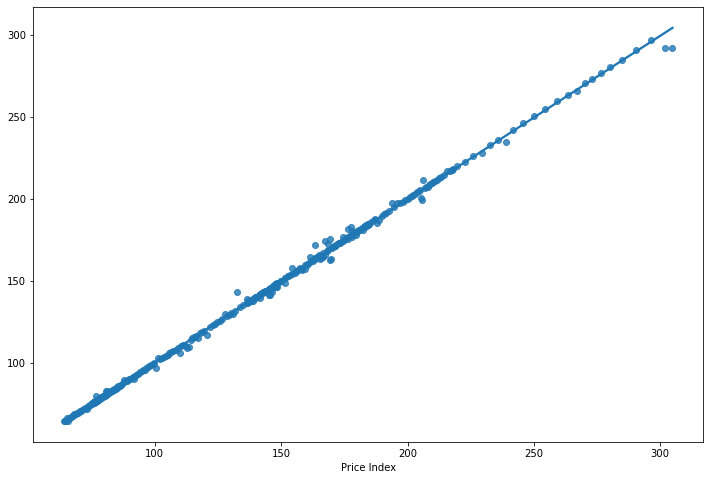

In [49]:
plt.figure(figsize=(12,8))
sb.regplot(x=y, y=y_prediction)

In [50]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y, y_prediction))
print('Mean Squared Error:', metrics.mean_squared_error(y, y_prediction))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y, y_prediction)))
print('Score:',xgb.score(x,y))

Mean Absolute Error: 0.5505493286132809
Mean Squared Error: 2.5332450929748362
Root Mean Squared Error: 1.591617131402787
Score: 0.9991189497535823
